# Sample 15arc-sec GEBCO_2023.nc on OM5 grid

## Apply edits to the topography.

## REGION= [[-30,0,-220,-100,],]

In [1]:
# Notebook editor: Brandon.Reichl

# This notebook originated from Stephen Griffies, with many other contributors:
# Stephen.Griffies
# Alistair.Adcroft
# Robert.Hallberg
# Niki.Zadeh
# Raphael.Dussin

In [1]:
Region_Boundaries = [-90,90,-300,60]
Region_Name = '25: Global Deep Ocean Channels'

In [2]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import netCDF4
import xarray as xr
import cmocean
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

import sys
sys.path.insert(1, './tools/')
from topo_tools import *

### Overview of three bathymetry products

Resolution = 240 cells/degree
GEBCO loaded with (nj,ni) =  (43200, 86400)  min(lon) =  -300.0  max(lon) =  60.0


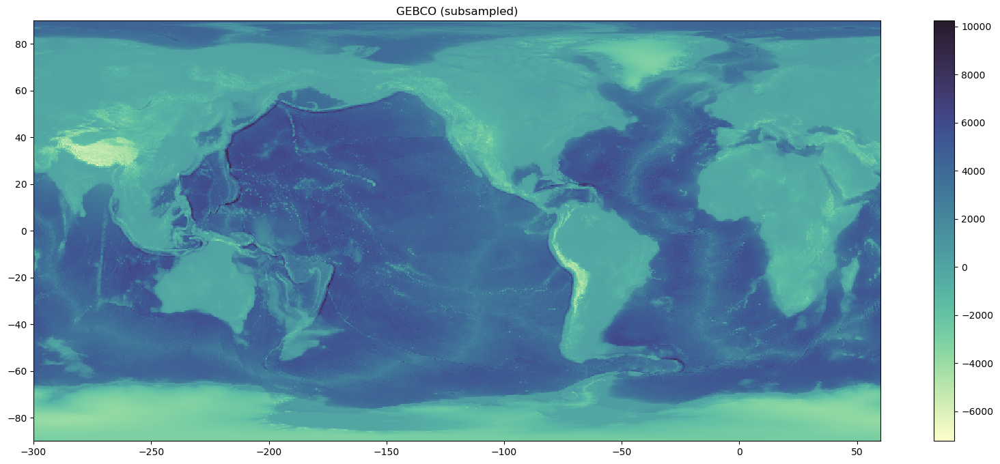

In [3]:
# GEBCO-2020 + Bedmachine combined topography 

fname_gebco  = "/archive/gold/datasets/topography/GEBCO_2023/GEBCO_2023.nc"

GEBCO = GEBCO_data(fname_gebco)

plt.figure(figsize=(20,8))
plt.pcolormesh(GEBCO.lonq[::100], GEBCO.latq[::100], GEBCO.depth[::100,::100], cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('GEBCO (subsampled)');

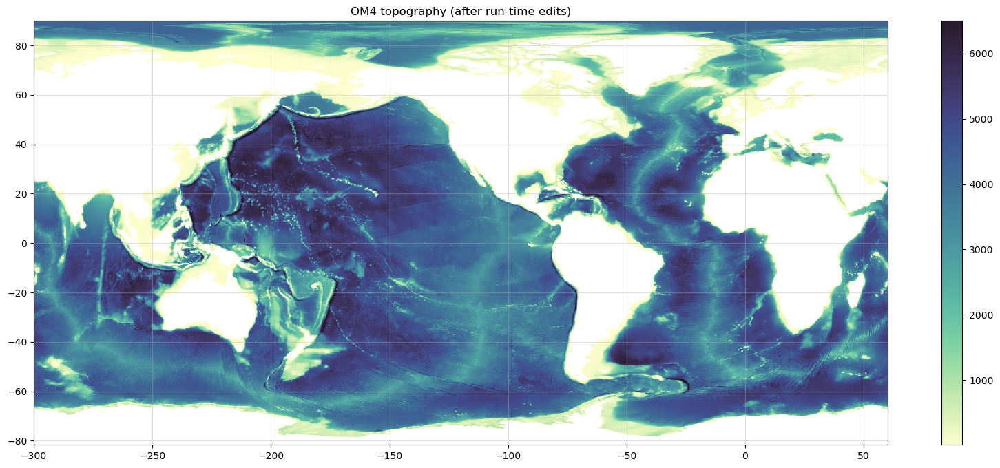

In [4]:
OM4 = OM4_data('/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_hgrid.nc',
               '/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_static.nc',
               '/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_mask.nc')
plt.figure(figsize=(20,8))
plt.pcolormesh(OM4.lonq, OM4.latq, OM4.depth, cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('OM4 topography (after run-time edits)');
plt.grid(True, alpha=0.4)

OM5 longitudes are inconsistent!
OM5 latitudes are inconsistent!


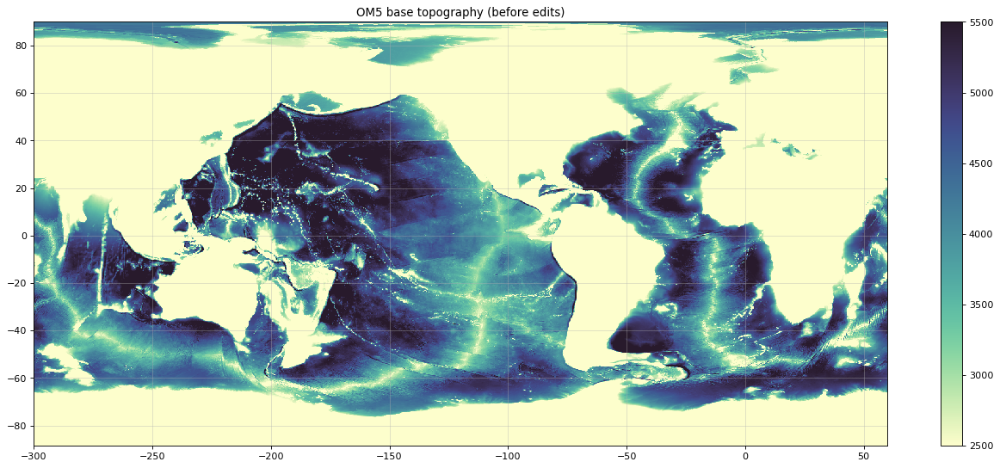

In [35]:
OM5 = OM5_data('/archive/jpk/OM5/OM5_025/prototypes/v20231109/tile_files/ocean_hgrid.nc',
               '/archive/jpk/OM5/OM5_025/prototypes/v20231109/tile_files/ocean_topog_merged.nc')

plt.figure(figsize=(20,8))
plt.pcolormesh(OM5.lonq, OM5.latq, OM5.depth, cmap=cmocean.cm.deep, vmin=2500, vmax=5500)
plt.colorbar(); plt.title('OM5 base topography (before edits)');
plt.grid(True, alpha=0.4)

# Edits to narrow channels mentioned in the bottom water pathways described within sections 3.3.3 and 3.3.4 of Paige Lavin's PhD thesis

[Lavin's PhD thesis](https://digital.lib.washington.edu/researchworks/handle/1773/47664) produces a new climatology for global bottom waters (based on all availably hydrography) and uses these to infer circulation pathways for bottom waters. Below, I have listed all mentions of passages, channels, gaps, and straits, in the order that they appear in the text.

In [24]:
plt.rcParams['figure.dpi'] = 80

## 3.3.3.1 Antarctic sourced pathways in the Atlantic Ocean

### Orkney Passage (-42, -61)
Deepened the sill depth


Gebco (js:je,is:ie) = 6359:7559,59759:64559
OM4 model (js:je,is:ie) = 171:214,994:1076
OM5 model (js:je,is:ie) = 252:295,994:1076
Using xlim = (-51.0, -31.0) ylim = (-63.5, -58.5)


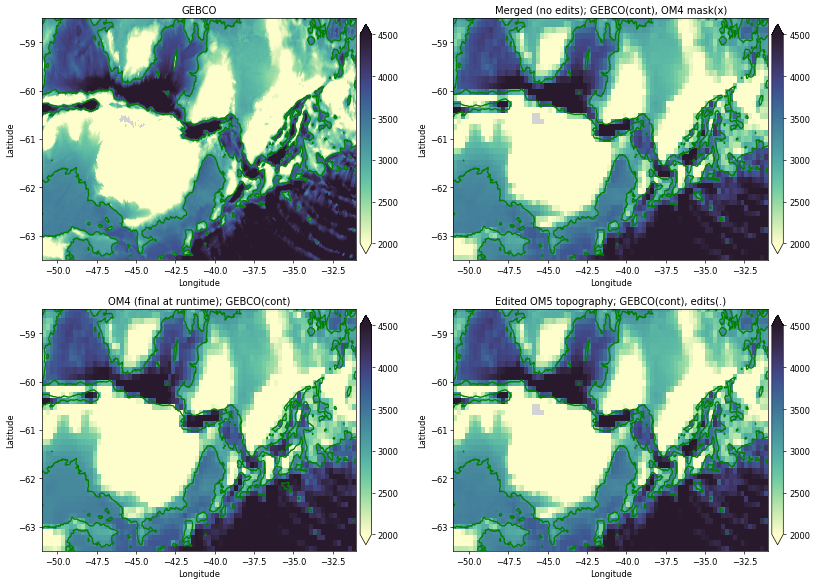

In [9]:
region = Region(-41, -61, width_lon=20., width_lat=5.)
map_region(region, 2000, 4500, GEBCO, OM4, OM5, '', gebco_contours=[3250.0], text_depths=False);

Gebco (js:je,is:ie) = 6839:7199,61739:62099
OM4 model (js:je,is:ie) = 188:202,1027:1035
OM5 model (js:je,is:ie) = 269:283,1027:1035
Using xlim = (-42.75, -41.25) ylim = (-61.5, -60.0)


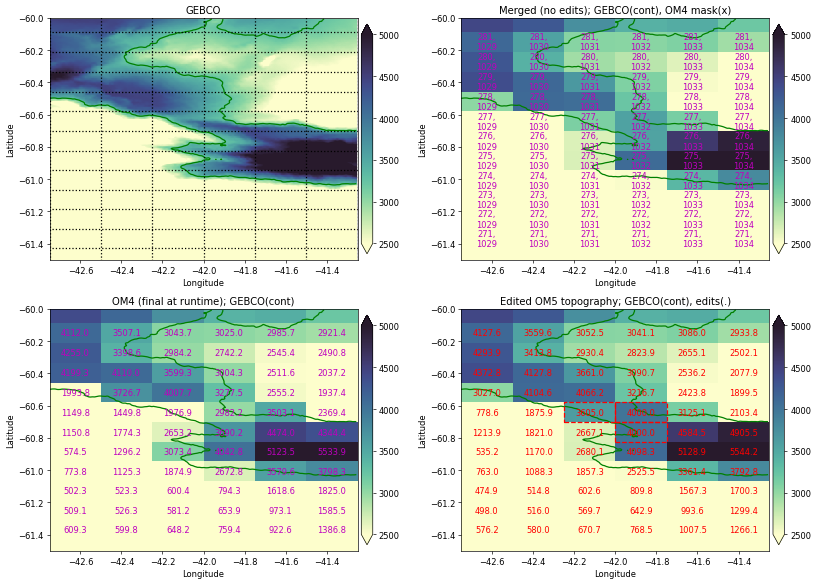

In [10]:
OM5.depth[277,1031]=3605.
OM5.depth[277,1032]=4000.
OM5.depth[276,1032]=4000.

sill_check = [[-41.6, -60.9, -42.4, -60.5]]
region = Region(-42., -60.75, width_lon=1.5, width_lat=1.5)
map_region(region, 2500, 5000, GEBCO, OM4, OM5, '', gebco_contours=[3250.0], text_depths=True)#, sill_check=sill_check);

### Shackleton Fracture Zone

Made the ridge shallower.

In [ ]:
region = Region(-60.5, -59, width_lon=8, width_lat=8)
map_region(region, 2500, 4500, GEBCO, OM4, OM5, '', gebco_contours=[3200.0], text_depths=False);

In [ ]:
OM5.depth[287,959]=2700.
OM5.depth[288,958]=2700.
OM5.depth[289,958]=2700.
OM5.depth[290,957]=2700.
OM5.depth[290,956]=2700.
OM5.depth[291,955]=2700.
OM5.depth[292,955]=2700.

region = Region(-60.5, -59, width_lon=2., width_lat=1.5)
map_region(region, 2500, 4500, GEBCO, OM4, OM5, '', gebco_contours=[3200.0], text_depths=True);

Gebco (js:je,is:ie) = 6869:7289,57869:58529
OM4 model (js:je,is:ie) = 189:205,963:976
OM5 model (js:je,is:ie) = 270:286,963:976
Using xlim = (-58.875, -56.125) ylim = (-61.375, -59.625)


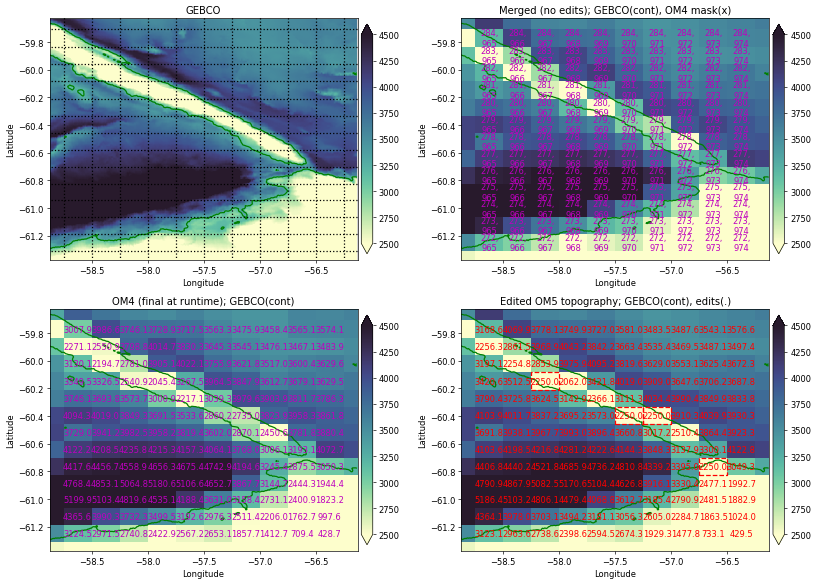

In [108]:
OM5.depth[276,973]=2250.
OM5.depth[279,971]=2250.
OM5.depth[279,970]=2250.
OM5.depth[281,967]=2250.

region = Region(-57.5, -60.5, width_lon=2.75, width_lat=1.75)
map_region(region, 2500, 4500, GEBCO, OM4, OM5, '', gebco_contours=[3200.0], text_depths=True);

### Georgia Passage (-31, -56)

Looks fine.

In [ ]:
region = Region(-31, -56, width_lon=2., width_lat=2.)
map_region(region, 3000, 4500, GEBCO, OM4, OM5, '', gebco_contours=[3200.0], text_depths=False);

### South Sandwich Island Arc

### South Sandwich Trench

Dug out South Sandwich trench

In [ ]:
region = Region(-25., -58.5, width_lon=15, width_lat=15)
map_region(region, 3000, 5500, GEBCO, OM4, OM5, '', gebco_contours=[4500.0], text_depths=False);

Gebco (js:je,is:ie) = 6749:7169,65939:66779
OM4 model (js:je,is:ie) = 185:201,1097:1113
OM5 model (js:je,is:ie) = 266:282,1097:1113
Using xlim = (-25.25, -21.75) ylim = (-61.875, -60.125)


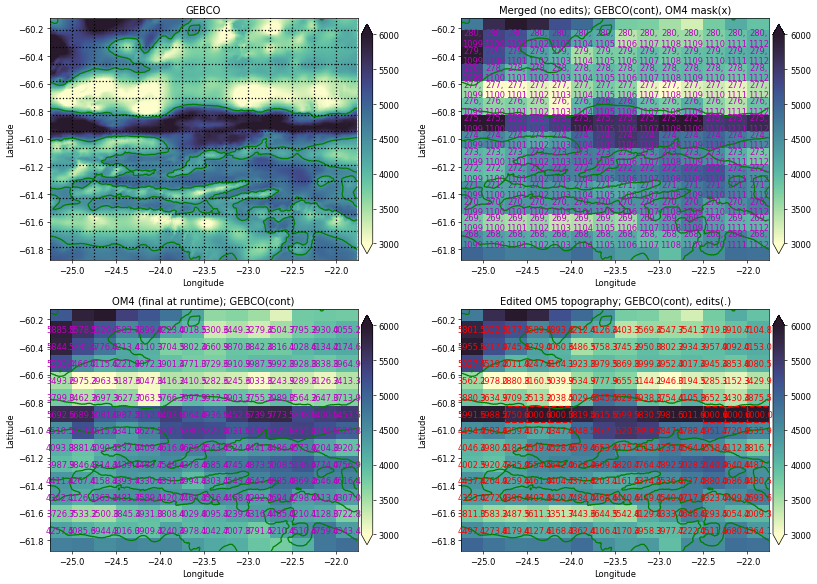

In [111]:
OM5.depth[275,1101]=5750.
OM5.depth[275,1102]=6000.
OM5.depth[275,1103]=6000.
OM5.depth[275,1110]=6000.
OM5.depth[275,1111]=6000.
OM5.depth[275,1112]=6000.

region = Region(-23.5, -61., width_lon=3.5, width_lat=1.75)
map_region(region, 3000, 6000, GEBCO, OM4, OM5, '', gebco_contours=[4500.0], text_depths=True);

### Deep sills along boundary between Georgia Basin and Argentine Basin

Made sill shallower to correctly block meridional flow

In [ ]:
region = Region(-32., -52, width_lon=20, width_lat=8)
map_region(region, 3000, 6000, GEBCO, OM4, OM5, '', gebco_contours=[4750.0], text_depths=False);

Gebco (js:je,is:ie) = 9605:10025,62489:63509
OM4 model (js:je,is:ie) = 271:283,1040:1059
OM5 model (js:je,is:ie) = 352:364,1040:1059
Using xlim = (-39.625, -35.375) ylim = (-49.975, -48.225)


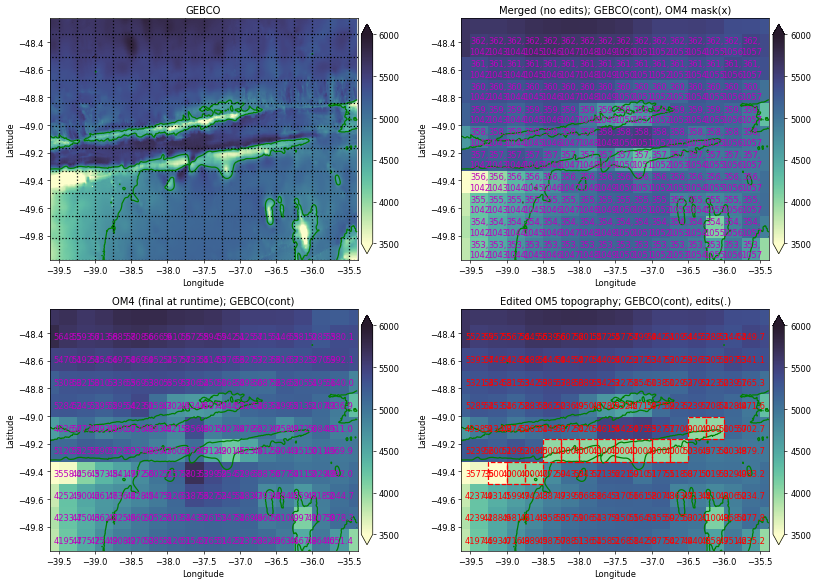

In [112]:
OM5.depth[356,1043] = 3500.
OM5.depth[356,1044] = 4000.
OM5.depth[356,1045] = 4000.
OM5.depth[357,1046] = 4000.
OM5.depth[357,1047] = 4000.
OM5.depth[357,1048] = 4000.
OM5.depth[357,1049] = 4000.
OM5.depth[357,1050] = 4000.
OM5.depth[357,1051] = 4000.
OM5.depth[357,1052] = 4000.
OM5.depth[357,1053] = 4000.
OM5.depth[358,1054] = 4000.
OM5.depth[358,1055] = 4000.

region = Region(-37.5, -49.1, width_lon=4.25, width_lat=1.75)
map_region(region, 3500, 6000, GEBCO, OM4, OM5, '', gebco_contours=[4750.0], text_depths=True);

In [ ]:
OM5.depth[347,1062]=5000.

region = Region(-35., -50.5, width_lon=2.5, width_lat=1.75)
map_region(region, 3000, 6000, GEBCO, OM4, OM5, '', gebco_contours=[4750.0], text_depths=True);

### Vema Channel

In [ ]:
region = Region(-39, -30, width_lon=4, width_lat=6)
map_region(region, 4250, 4900, GEBCO, OM4, OM5, '', gebco_contours=[4500.0], text_depths=False);

In [ ]:
OM5.depth[447, 1041]=4700.
OM5.depth[448, 1041]=4700.
OM5.depth[448, 1042]=4700.
OM5.depth[449, 1042]=4700.
OM5.depth[450, 1042]=4700.
OM5.depth[451, 1042]=4700.
OM5.depth[452, 1042]=4700.
OM5.depth[453, 1042]=4700.
OM5.depth[454, 1042]=4700.
OM5.depth[455, 1042]=4700.
OM5.depth[455, 1041]=4700.

region = Region(-39.5, -32, width_lon=1.5, width_lat=2.5)
map_region(region, 4250, 4900, GEBCO, OM4, OM5, '', gebco_contours=[4500.0], text_depths=True);

In [ ]:
OM5.depth[456, 1042]=4700.
OM5.depth[457, 1042]=4700.
OM5.depth[458, 1042]=4700.
OM5.depth[459, 1042]=4700.
OM5.depth[460, 1042]=4700.
OM5.depth[461, 1042]=4700.
OM5.depth[461, 1043]=4700.
OM5.depth[462, 1043]=4700.
OM5.depth[462, 1044]=4700.
OM5.depth[463, 1044]=4700.
OM5.depth[463, 1045]=4700.
OM5.depth[463, 1046]=4700.
OM5.depth[464, 1046]=4700.
OM5.depth[465, 1046]=4700.
OM5.depth[465, 1047]=4700.
OM5.depth[466, 1047]=4700.
OM5.depth[466, 1048]=4700.
OM5.depth[467, 1048]=4700.
OM5.depth[467, 1049]=4700.
OM5.depth[467, 1050]=4700.


region = Region(-38.5, -29.5, width_lon=2.25, width_lat=3.25)
map_region(region, 4250, 4900, GEBCO, OM4, OM5, '', gebco_contours=[4500.0], text_depths=True);

Gebco (js:je,is:ie) = 13679:15119,62159:63119
OM4 model (js:je,is:ie) = 362:392,1034:1052
OM5 model (js:je,is:ie) = 443:473,1034:1052
Using xlim = (-41.0, -37.0) ylim = (-33.0, -27.0)


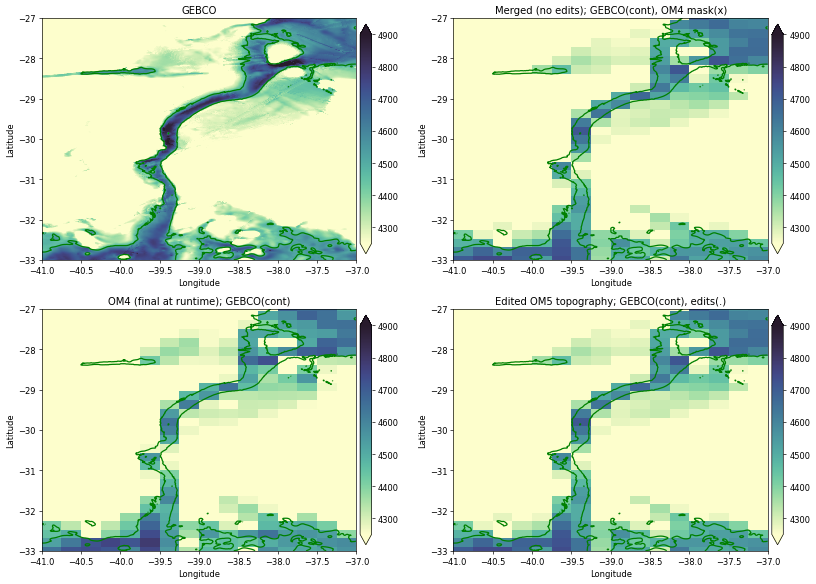

In [113]:
region = Region(-39, -30, width_lon=4, width_lat=6)
map_region(region, 4250, 4900, GEBCO, OM4, OM5, '', gebco_contours=[4500.0], text_depths=False);

### Hunter Channel

Note: Hunter channel is not the zonal fracture zone cutting through part the Rio Grande Ridge! It is instead the meridional passage through the rough topography around 28.5º W.

This was pretty messy to edit, but I tried to ensure the two narrow and deep passages were adequately connected.

In [ ]:
region = Region(-30.5, -34.5, width_lon=12.5, width_lat=12.5)
map_region(region, 3500, 5000, GEBCO, OM4, OM5, '', gebco_contours=[4000.0], text_depths=False);

Gebco (js:je,is:ie) = 12959:13679,65189:65849
OM4 model (js:je,is:ie) = 347:364,1085:1098
OM5 model (js:je,is:ie) = 428:445,1085:1098
Using xlim = (-28.375, -25.625) ylim = (-36.0, -33.0)


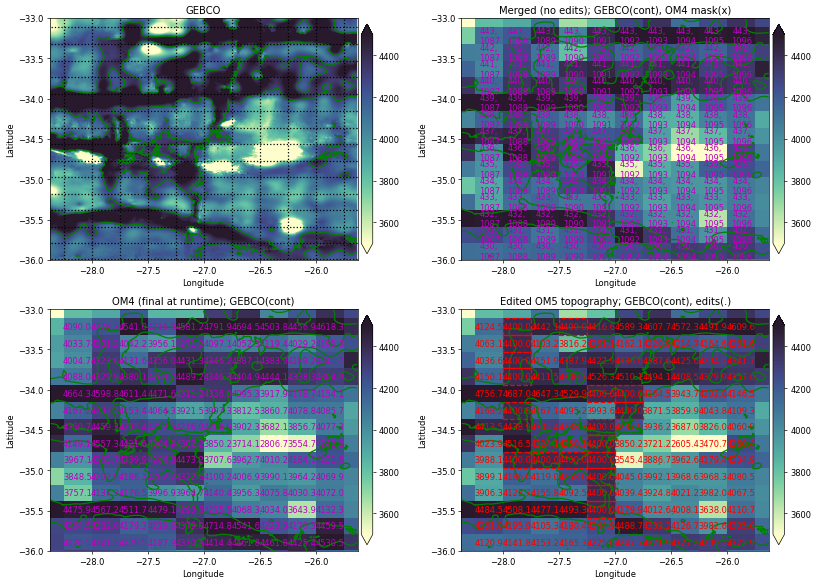

In [114]:
OM5.depth[432, 1091]=4400.
OM5.depth[433, 1091]=4400.
OM5.depth[434, 1091]=4400.
OM5.depth[435, 1091]=4400.

OM5.depth[435, 1090]=4400.
OM5.depth[435, 1089]=4400.
OM5.depth[435, 1088]=4400.

OM5.depth[438, 1088]=4400.
OM5.depth[440, 1088]=4400.
OM5.depth[441, 1088]=4400.
OM5.depth[442, 1088]=4400.
OM5.depth[443, 1088]=4400.
OM5.depth[443, 1088]=4400.
OM5.depth[443, 1090]=4400.

OM5.depth[439, 1091]=4400.

OM5.depth[436, 1091]=4400.
OM5.depth[437, 1091]=4400.
OM5.depth[438, 1092]=4400.
OM5.depth[439, 1092]=4400.

region = Region(-27.0, -34.5, width_lon=2.75, width_lat=3.)
map_region(region, 3500, 4500, GEBCO, OM4, OM5, '', gebco_contours=[4300.0], text_depths=True);

In [ ]:
OM5.depth[447, 1098]=4400.
OM5.depth[447, 1099]=4400.

region = Region(-27.0, -34.5, width_lon=6, width_lat=7.5)
map_region(region, 3500, 4500, GEBCO, OM4, OM5, '', gebco_contours=[4300.0], text_depths=False);

### Romanche and Chain Fracture Zones

The Romanche Fracture Zone is the deepest exchange pathway for bottom waters in the central Atlantic, with a throughflow of ~1.3 Sv (Polzin 1996). It is very poorly represented in OM5 (and OM4), so it probably worth fixing it up.

In [ ]:
region = Region(-18, -1, width_lon=12, width_lat=8)
map_region(region, 3000, 5500, GEBCO, OM4, OM5, '', gebco_contours=[4000.0], text_depths=False);

In [ ]:
OM5.depth[581, 1105:1107] = 3000
OM5.depth[581, 1107:1112] = 3250
OM5.depth[582, 1112:1117] = 3250
OM5.depth[583, 1117:1119] = 3250

OM5.depth[579, 1109] = 4750
OM5.depth[580, 1111] = 4750
OM5.depth[580, 1112] = 5000
OM5.depth[581, 1112] = 4750
OM5.depth[581, 1113:1118] = 5500
OM5.depth[582, 1117:1119] = 5500

OM5.depth[580, 1113:1118] = 3000
OM5.depth[581, 1118] = 3000

region = Region(-22, -0.75, width_lon=3.5, width_lat=2.5)
map_region(region, 3000, 5500, GEBCO, OM4, OM5, '', gebco_contours=[4000.0], text_depths=True);

In [ ]:
OM5.depth[583, 1119:1122] = 3500
OM5.depth[584, 1122:1126] = 3500
OM5.depth[585, 1126:1128] = 3000

OM5.depth[582-1, 1119:1123] = 3000
OM5.depth[583-1, 1123:1128] = 3000
OM5.depth[584-1, 1128:1132] = 3000
OM5.depth[585-1, 1132:1134] = 3000

OM5.depth[582, 1121] = 4500
OM5.depth[582, 1122] = 5500
OM5.depth[583, 1122:1128] = 5500
OM5.depth[584, 1127:1132] = 5500
OM5.depth[585, 1131:1134] = 5250

region = Region(-18.5, -0.5, width_lon=3.75, width_lat=2.5)
map_region(region, 3000, 5500, GEBCO, OM4, OM5, '', gebco_contours=[4250.0], text_depths=True);

In [ ]:
OM5.depth[586, 1133:1135] = 2750
OM5.depth[585, 1134:1136] = 5000
OM5.depth[586, 1135:1143] = 4750

region = Region(-15.5, 0.5, width_lon=3.5, width_lat=2.5)
map_region(region, 3000, 5500, GEBCO, OM4, OM5, '', gebco_contours=[4250.0], text_depths=True);

Gebco (js:je,is:ie) = 21119:21839,66239:68639
OM4 model (js:je,is:ie) = 494:508,1102:1144
OM5 model (js:je,is:ie) = 575:589,1102:1144
Using xlim = (-24.0, -14.0) ylim = (-2.0, 1.0)


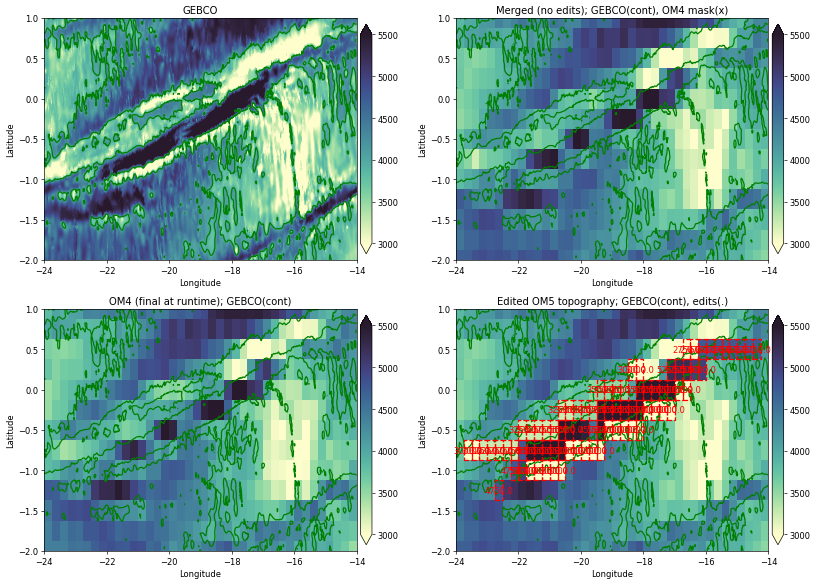

In [118]:
region = Region(-19, -0.5, width_lon=10, width_lat=3)
map_region(region, 3000, 5500, GEBCO, OM4, OM5, '', gebco_contours=[4000.0], text_depths=False);

In [ ]:
# Only 0.1 Sv goes through the Chain Fracture Zone, so it doesn't seem worth it.

region = Region(-16, -2, width_lon=3.25, width_lat=2.5)
map_region(region, 3000, 5500, GEBCO, OM4, OM5, '', gebco_contours=[4300.0], text_depths=True);

### Narrow channel between Ceará Abyssal Plain and Brazil Basin
Looks just fine already.

In [ ]:
region = Region(-36, 0, width_lon=20, width_lat=10)
map_region(region, 3000, 5500, GEBCO, OM4, OM5, '', gebco_contours=[4000.0], text_depths=False);

### Equatorial channel (-40, 3)
I think this must be a typo and Lavin means this channel at 1º?

In [ ]:
region = Region(-40, 1, width_lon=3, width_lat=2.5)
map_region(region, 3000, 5500, GEBCO, OM4, OM5, '', gebco_contours=[4000.0], text_depths=True);

### Outflow of Brazil Basin at (-44, 8.5)

Depth gradients are small and smooth enough that this is probably okay already.

In [ ]:
region = Region(-44, 8.5, width_lon=10, width_lat=5)
map_region(region, 3500, 5000, GEBCO, OM4, OM5, '', gebco_contours=[4000.0], text_depths=False);

### Vema Fracture Zone (-44, 11)

In [ ]:
region = Region(-42.5, 11, width_lon=12, width_lat=4)
map_region(region, 3500, 5000, GEBCO, OM4, OM5, '', gebco_contours=[4000.0], text_depths=False);

Gebco (js:je,is:ie) = 23939:24419,60899:61739
OM4 model (js:je,is:ie) = 541:551,1013:1029
OM5 model (js:je,is:ie) = 622:632,1013:1029
Using xlim = (-46.25, -42.75) ylim = (9.75, 11.75)


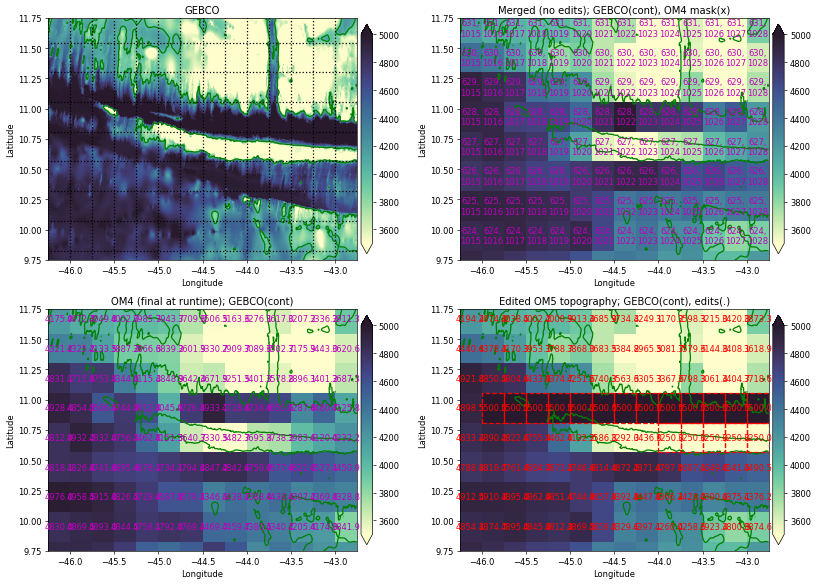

In [119]:
OM5.depth[628,1016:1029] = 5500.
OM5.depth[627,1024:1029] = 3250.

region = Region(-44.5, 10.75, width_lon=3.5, width_lat=2)
map_region(region, 3500, 5000, GEBCO, OM4, OM5, '', gebco_contours=[4000.0], text_depths=True);

Gebco (js:je,is:ie) = 23939:24419,61559:62519
OM4 model (js:je,is:ie) = 541:551,1024:1042
OM5 model (js:je,is:ie) = 622:632,1024:1042
Using xlim = (-43.5, -39.5) ylim = (9.75, 11.75)


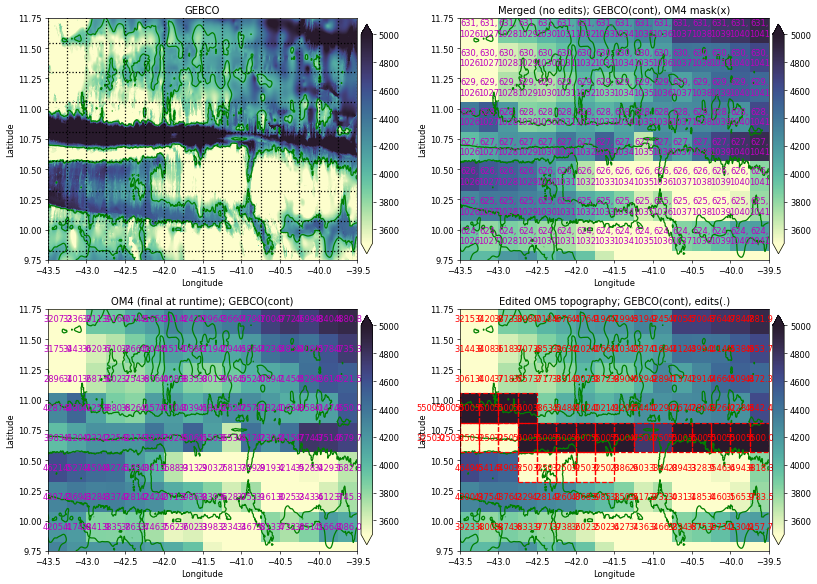

In [120]:
OM5.depth[627:629, 1029] = 5500
OM5.depth[627, 1029:1043] = 5500
OM5.depth[627, 1035:1037] = 4750

OM5.depth[626, 1029:1034] = 3250

region = Region(-41.5, 10.75, width_lon=4, width_lat=2)
map_region(region, 3500, 5000, GEBCO, OM4, OM5, '', gebco_contours=[4000.0], text_depths=True);

### Puerto Rico Trench (-65, 20)

### East Azores Fracture Zone (-XX, 37)

### Corner Rise Seamounts (-XX, 32)

### Gaps in Southern Mid-Atlanatic Ridge (e.g. at (-8, 50))

### Gap between Discovery Seamounts and Agulhas Ridge

### Gaps in Walvis Ridge at (-7, -36) and (-3, -32)

## 3.3.3.2 Antarctic sourced pathways in the Indian Ocean

### Gaps in Southwest Indian Ridge (30, -50)

### Prince Edward Fracture Zone (35, ?)

### Mozambique Channel (between Madagascar and African continent)

### Gap between Agulhas and Mozambique plateaus

### Sill between Crozet and Kerguelen islands

### Atlantis II Fracture Zone (57, ?), Melville Fracture Zone (60.5), Indomed Fracture Zone (46)

### Owen Fracture Zone (57, 10)

### Deep Fracture Zones (125-127, ?) between Australian-Antarctic Discordance and South Australian Basin 

### Deep gap between Broken and Naturaliste plateaus (103-108, -33)

### Narrow channel along eastern flank of the Ninetyeast Ridge (90, 12)

### Gaps in Ninetyeast Ridge at (90, -5), (90, -10), (90, -28)

## 3.3.3.3 Antarctic sourced pathways in the Pacific Ocean

### Fracture Zones bisecting the Southeast Indian Ridge (150-160, -62), especially Balleny (155)

Seems to be fine.

In [ ]:
region = Region(155-360, -62, width_lon=8, width_lat=8)
map_region(region, 2000, 3500, GEBCO, OM4, OM5, '', gebco_contours=[5000], text_depths=False);

### Gaps in the Pacific-Antarctic Ridge south and southwest of Campbell Plateau

### Gaps in Louisville Ridge east of Chatham Rise

### Gap at (-163.5, -42)

### Samoan Passage

In [ ]:
## Samoan passage
sill_check = [[-169, -9.5, -168.7, -8.5], [-168.7, -8.5, -168.7, -7.75]] # [lonA,latA,lonB,latB]

region = Region(-165, -10, width_lon=10, width_lat=10)
map_region(region, 2000, 6000, GEBCO, OM4, OM5, '', gebco_contours=[5000], text_depths=False);

region = Region(-169, -9, width_lon=1.5, width_lat=3)
map_region(region, 3500, 5500, GEBCO, OM4, OM5, '', gebco_contours=[5000],text_depths=True, sill_check=sill_check);

Gebco (js:je,is:ie) = 19079:19799,31259:31619
OM4 model (js:je,is:ie) = 460:474,519:527
OM5 model (js:je,is:ie) = 541:555,519:527
Using xlim = (-169.75, -168.25) ylim = (-10.5, -7.5)


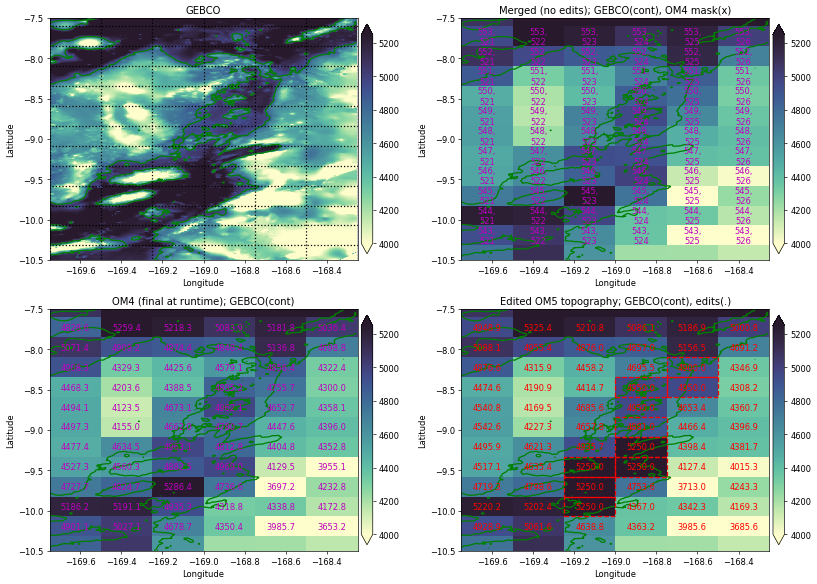

In [121]:
## Samoan passage

OM5.depth[544,523]=5250.
OM5.depth[545,523]=5250.
OM5.depth[546,523]=5250.
OM5.depth[546,524]=5250.
OM5.depth[547,524]=5250.
OM5.depth[548,524]=4881.
OM5.depth[550,524]=4950.
OM5.depth[550,525]=4950.
OM5.depth[551,525]=4900.

region = Region(-169, -9, width_lon=1.5, width_lat=3)
map_region(region, 4000, 5250, GEBCO, OM4, OM5, '', gebco_contours=[4881.0], text_depths=True);

### Gap in Robbie Ridge

Channel not sufficiently well defined to be worth it.

In [ ]:
region = Region(-175, -10, width_lon=15, width_lat=5)
map_region(region, 3000, 5000, GEBCO, OM4, OM5, '', gebco_contours=[4000], text_depths=False);

### Wake Island Passage at (169, 18) and other gap in Marshall Islands (168, 16.5)

Wake Island Passage looks well resolved (although I added in the seamount in the middle) and I don't see what is meant by the other gap.

In [ ]:
OM5.depth[658,434]=3000.

region = Region(168.5-360, 17, width_lon=10, width_lat=10)
map_region(region, 3000, 6000, GEBCO, OM4, OM5, '', gebco_contours=[5000], text_depths=False);

### Gaps in Boudeuse Ridge (-151.5, -8.5)
Looks fine.

In [ ]:
region = Region(-150.5, -9.5, width_lon=15, width_lat=15)
map_region(region, 2500, 6000, GEBCO, OM4, OM5, '', gebco_contours=[], text_depths=False);

### Gaps between the Line Islands, e.g. Horizon Passage at (-168, 18) and Clarion Passage at (-164, 12.5)

In [ ]:
OM5.depth[657,523]=4750.
OM5.depth[658,523]=4750.

region = Region(-166, 16, width_lon=12, width_lat=12)
map_region(region, 3500, 6500, GEBCO, OM4, OM5, '', gebco_contours=[], text_depths=False);

### Gap in Gilbert Ridge (175, 3)
Looks fine.

In [ ]:
region = Region(175-360, -3, width_lon=12, width_lat=12)
map_region(region, 3500, 7000, GEBCO, OM4, OM5, '', gebco_contours=[], text_depths=False);

### Molokai Fracture Zone (-140, 23)

Doesn't seem to be impeding flow. Could be improved but probably not worth digging out all fracture zones by hand!

In [ ]:
region = Region(-140, 23, width_lon=40, width_lat=10)
map_region(region, 3500, 6000, GEBCO, OM4, OM5, '', gebco_contours=[], text_depths=False);

### Clarion Fracture Zone (-140, 17)

Doesn't seem to be impeding flow. Could be improved but probably not worth digging out all fracture zones by hand!

In [ ]:
region = Region(-140, 17, width_lon=40, width_lat=10)
map_region(region, 3500, 6000, GEBCO, OM4, OM5, '', gebco_contours=[], text_depths=False);

### West Pacific trenches

Just to show the larger region

In [ ]:
region = Region(140-360, 11, width_lon=15, width_lat=40)
map_region(region, 3500, 7000, GEBCO, OM4, OM5, '', gebco_contours=[], text_depths=False);

### Yap-Mariana Junction (140, 11)

Gebco (js:je,is:ie) = 23879:24599,18840:19560
OM4 model (js:je,is:ie) = 540:554,312:326
OM5 model (js:je,is:ie) = 621:635,312:326
Using xlim = (-221.5, -218.5) ylim = (9.5, 12.5)


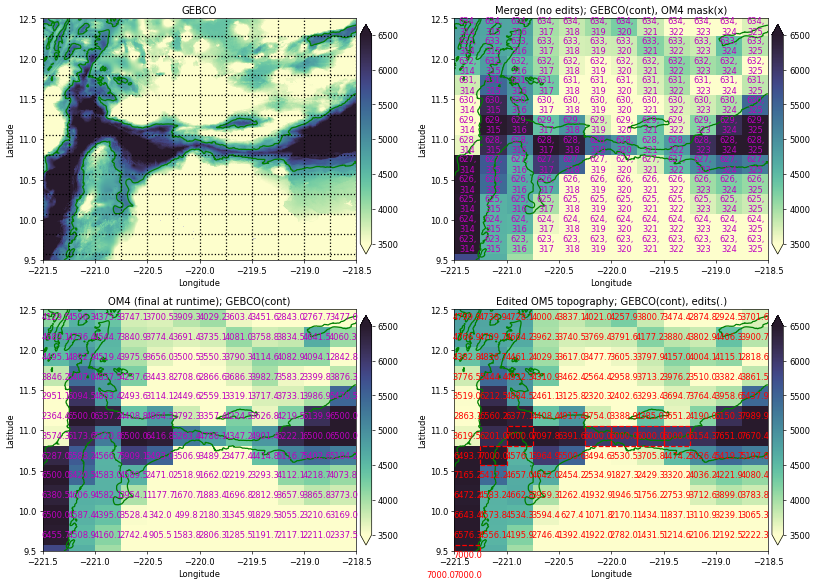

In [123]:
OM5.depth[628, 322]=6000.
OM5.depth[628, 321]=6000.
OM5.depth[628, 320]=6000.
OM5.depth[628, 320]=6000.
OM5.depth[628, 319]=6000.
OM5.depth[628, 316]=7000.
OM5.depth[627, 315]=7000.

region = Region(140-360, 11, width_lon=3, width_lat=3)
map_region(region, 3500, 6500, GEBCO, OM4, OM5, '', gebco_contours=[5000], text_depths=True);

### Yap Trench

Gebco (js:je,is:ie) = 23159:24119,18000:18960
OM4 model (js:je,is:ie) = 528:546,298:316
OM5 model (js:je,is:ie) = 609:627,298:316
Using xlim = (-225.0, -221.0) ylim = (6.5, 10.5)


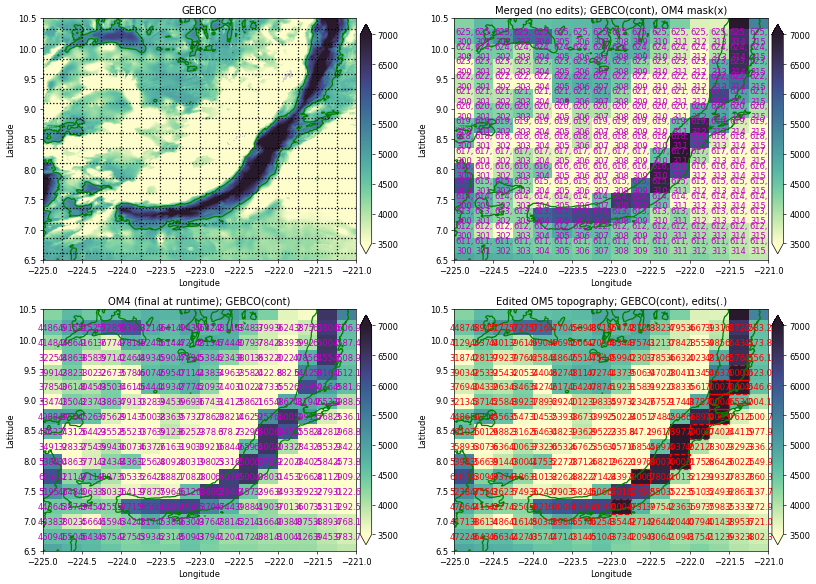

In [124]:
OM5.depth[622, 314]=7000.
OM5.depth[621, 314]=7000.
OM5.depth[621, 313]=7000.
OM5.depth[620, 313]=7000.
OM5.depth[619, 313]=7000.
OM5.depth[618, 312]=7000.
OM5.depth[616, 311]=7000.
OM5.depth[616, 311]=7000.
OM5.depth[615, 309]=7000.
OM5.depth[613, 308]=7000.

region = Region(137-360, 8.5, width_lon=4, width_lat=4)
map_region(region, 3500, 7000, GEBCO, OM4, OM5, '', gebco_contours=[5000], text_depths=True);

### Mariana Trench

In [ ]:
OM5.depth[664, 350]=6000.
OM5.depth[665, 353]=5000.

region = Region(-212.5, 19.5, width_lon=3, width_lat=3)
map_region(region, 3500, 7000, GEBCO, OM4, OM5, '', gebco_contours=[5000], text_depths=True);

### Channel near southern boundary of the Philippine Basin

### Passages between and around Hess Rise and Hawaiian Ridge (-177, 31)
Looks fine.

In [ ]:
region = Region(177-360, 34, width_lon=20, width_lat=20)
map_region(region, 3000, 6000, GEBCO, OM4, OM5, '', gebco_contours=[], text_depths=False);

In [ ]:
region = Region(-177, 31, width_lon=10, width_lat=10)
map_region(region, 2000, 6000, GEBCO, OM4, OM5, '', gebco_contours=[5000], text_depths=False);

### Main Gap (Nintoku Passage) at (173, 39)
Main gap and smaller passages all well-resolved.

In [ ]:
#OM5.depth[,]=

region = Region(173-360, 39, width_lon=10, width_lat=10)
map_region(region, 2000, 6000, GEBCO, OM4, OM5, '', gebco_contours=[5000], text_depths=False);

### Passage out of Aleutian Trench at (-168, 51)

### Near Strait?

### Kamchatka Strait (-164, 56)

### Galapagos triple junction (-101, 2)

### Quebrada Fracture Zone (-103, 3.5)

### Wilkes Fracture Zone (-105, -10.5)

### Yaquina Fracture Zone (-109, -6.5)

### Gap in Galapagos Ridge (-105, -17)

### Valdivia Fracture Zone (-87, -41)

### Chile Fracture Zone (-99, -36)

### Sill between Sala-y-Gomez and Nazca Ridges (-84, -24)

### Peru-Chile Trench

## 3.3.4 NADW

Gebco (js:je,is:ie) = 32999:38999,64679:70679
OM4 model (js:je,is:ie) = 718:924,1076:1171
OM5 model (js:je,is:ie) = 799:1005,1076:1171
Using xlim = (-30.5, -5.5) ylim = (47.5, 72.5)


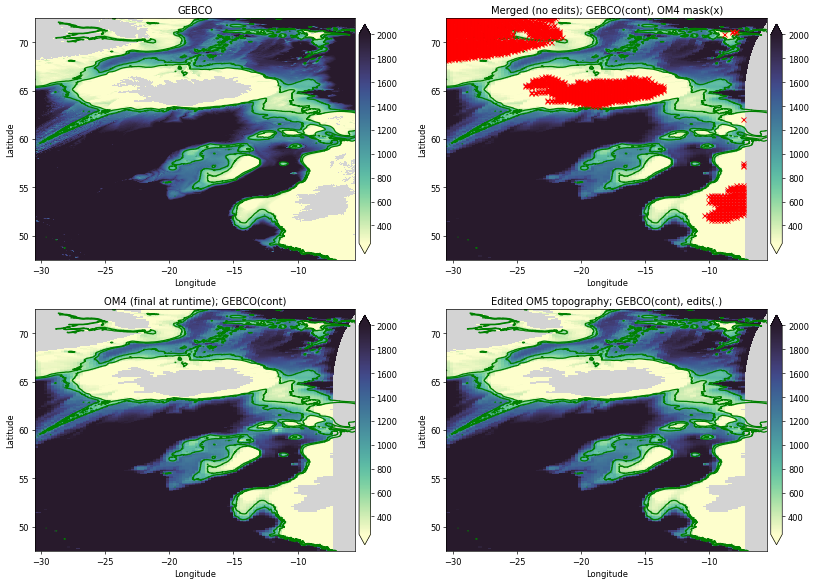

In [13]:
# context map
region = Region(-18, 60, width_lon=25, width_lat=25)
map_region(region, 250, 2000, GEBCO, OM4, OM5, '', gebco_contours=[500,1000], text_depths=False);

### Denmark Strait (-24, 67)

Well-resolved

Gebco (js:je,is:ie) = 36719:38159,64799:66239
OM4 model (js:je,is:ie) = 829:886,1078:1104
OM5 model (js:je,is:ie) = 910:967,1078:1104
Using xlim = (-30.0, -24.0) ylim = (63.0, 69.0)


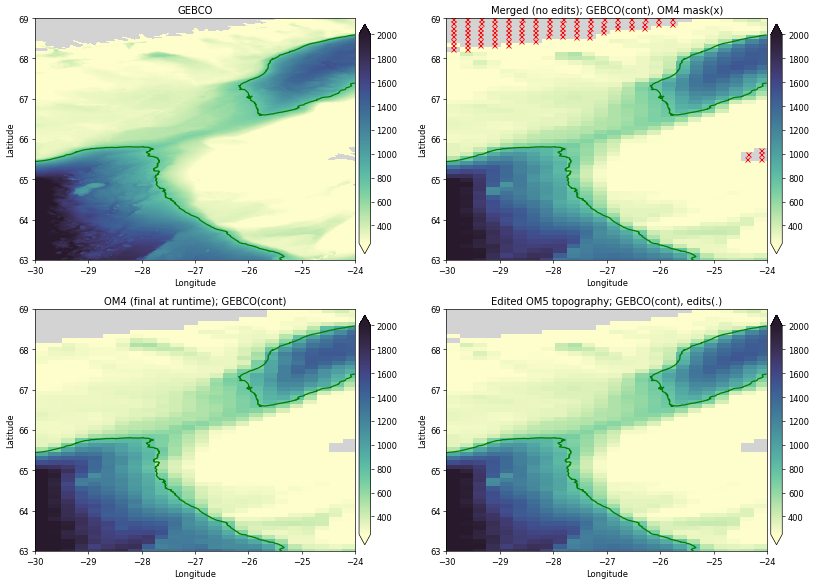

In [8]:
region = Region(-27, 66., width_lon=6, width_lat=6)
map_region(region, 250, 2000, GEBCO, OM4, OM5, '', gebco_contours=[750], text_depths=False);

### Iceland-Faroe Ridge

well resolved

Gebco (js:je,is:ie) = 36359:37079,68999:69719
OM4 model (js:je,is:ie) = 816:845,1148:1162
OM5 model (js:je,is:ie) = 897:926,1148:1162
Using xlim = (-12.5, -9.5) ylim = (61.5, 64.5)


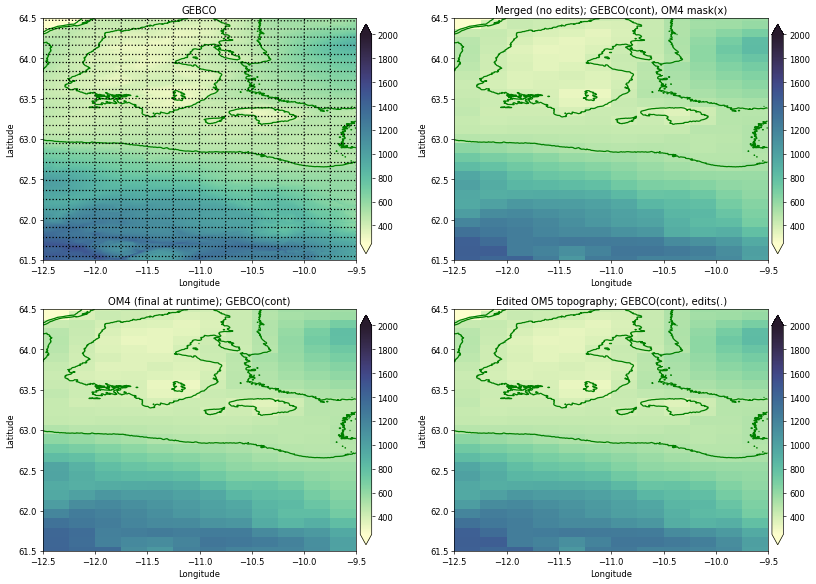

In [21]:
region = Region(-11, 63, width_lon=3, width_lat=3)
map_region(region, 250, 2000, GEBCO, OM4, OM5, '', gebco_contours=[300,400,500], text_depths=False);

### Faroe-Shetland Channel

well resolved

Gebco (js:je,is:ie) = 35939:36539,70619:71219
OM4 model (js:je,is:ie) = 802:824,1175:1187
OM5 model (js:je,is:ie) = 883:905,1175:1187
Using xlim = (-5.75, -3.25) ylim = (59.75, 62.25)


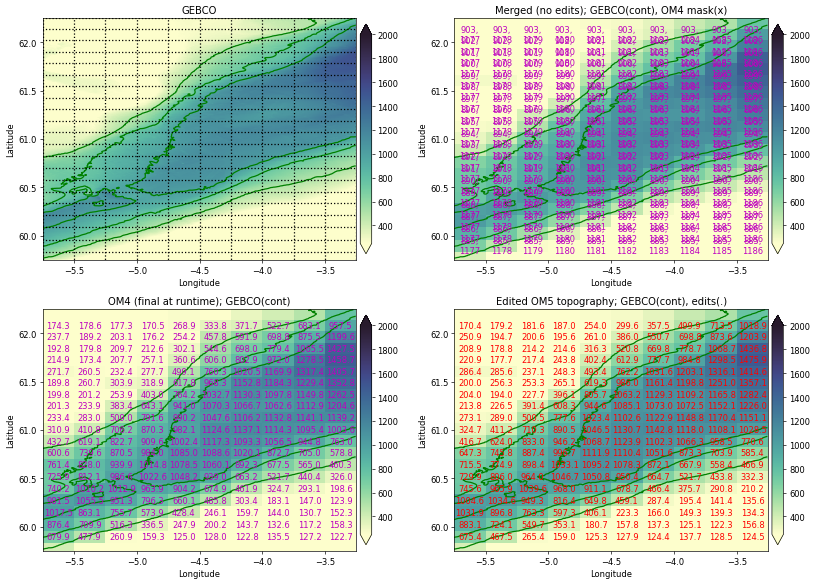

In [86]:
region = Region(-4.5, 61, width_lon=2.5, width_lat=2.5)
map_region(region, 250, 2000, GEBCO, OM4, OM5, '', gebco_contours=[500,750,1000], text_depths=True);

### Wyville Thomson Ridge overflow

Gebco (js:je,is:ie) = 35759:36239,70079:70559
OM4 model (js:je,is:ie) = 796:814,1166:1176
OM5 model (js:je,is:ie) = 877:895,1166:1176
Using xlim = (-8.0, -6.0) ylim = (59.0, 61.0)


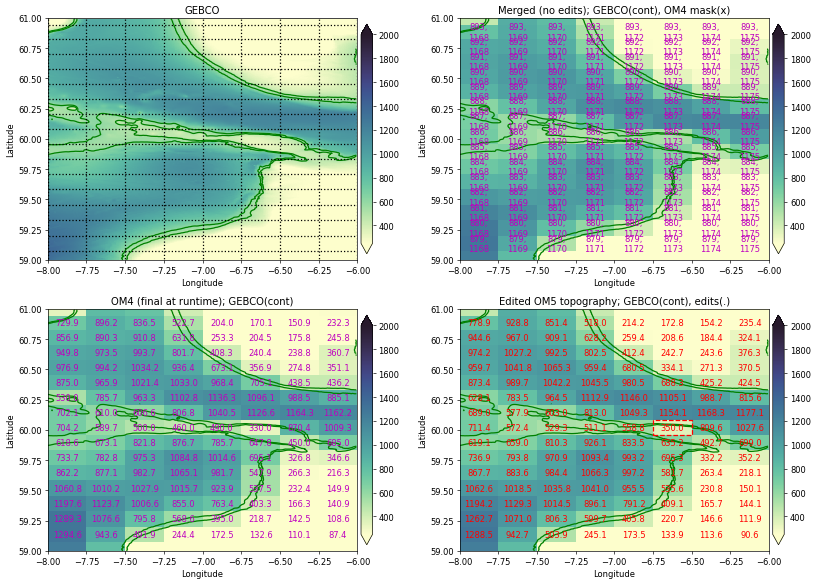

In [22]:
OM5.depth[886, 1173]=350. # made shallower by ~ 150 m

region = Region(-7, 60, width_lon=2, width_lat=2)
map_region(region, 250, 2000, GEBCO, OM4, OM5, '', gebco_contours=[500,600], text_depths=True);

### Faroe Bank Channel (already treated in another notebook)

### Dense overflows over Iceland-Faroe Ridge

should be addressed in Iceland-Faroe Ridge cell above

### Gaps in the Reykjanes Ridge

Gebco (js:je,is:ie) = 35639:36839,64919:66119
OM4 model (js:je,is:ie) = 792:835,1080:1102
OM5 model (js:je,is:ie) = 873:916,1080:1102
Using xlim = (-29.5, -24.5) ylim = (58.5, 63.5)


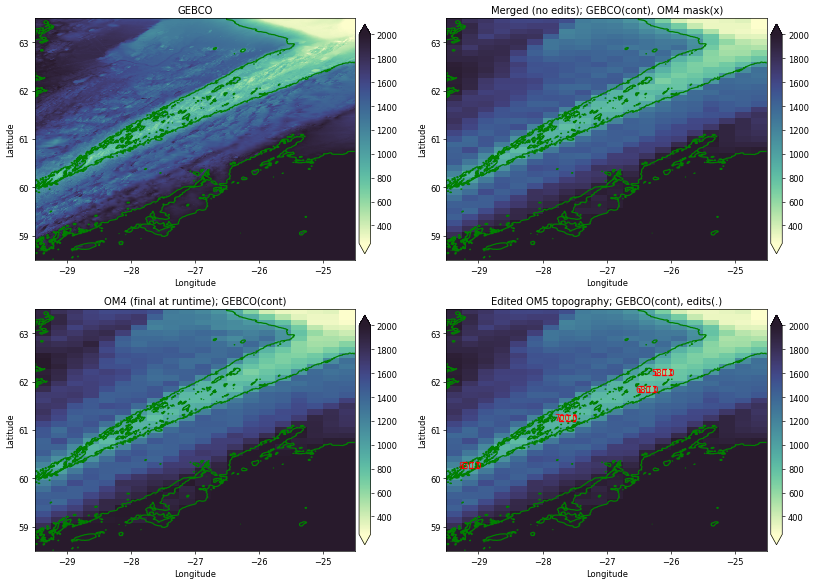

In [23]:
OM5.depth[888, 1083]=830. # made shallower by ~ 100 m
OM5.depth[896, 1089]=700. # made shallower by ~ 100 m
OM5.depth[901, 1094]=680. # made shallower by ~ 100 m
OM5.depth[904, 1095]=580. # made shallower by ~ 100 m

region = Region(-27, 61, width_lon=5, width_lat=5)
map_region(region, 250, 2000, GEBCO, OM4, OM5, '', gebco_contours=[1000,2000], text_depths=False);

### Charlie-Gibbs Fracture Zone

many changes through the center of the fracture zone (mostly making deeper)

Gebco (js:je,is:ie) = 33359:34559,64199:65399
OM4 model (js:je,is:ie) = 727:762,1068:1090
OM5 model (js:je,is:ie) = 808:843,1068:1090
Using xlim = (-32.5, -27.5) ylim = (49.0, 54.0)


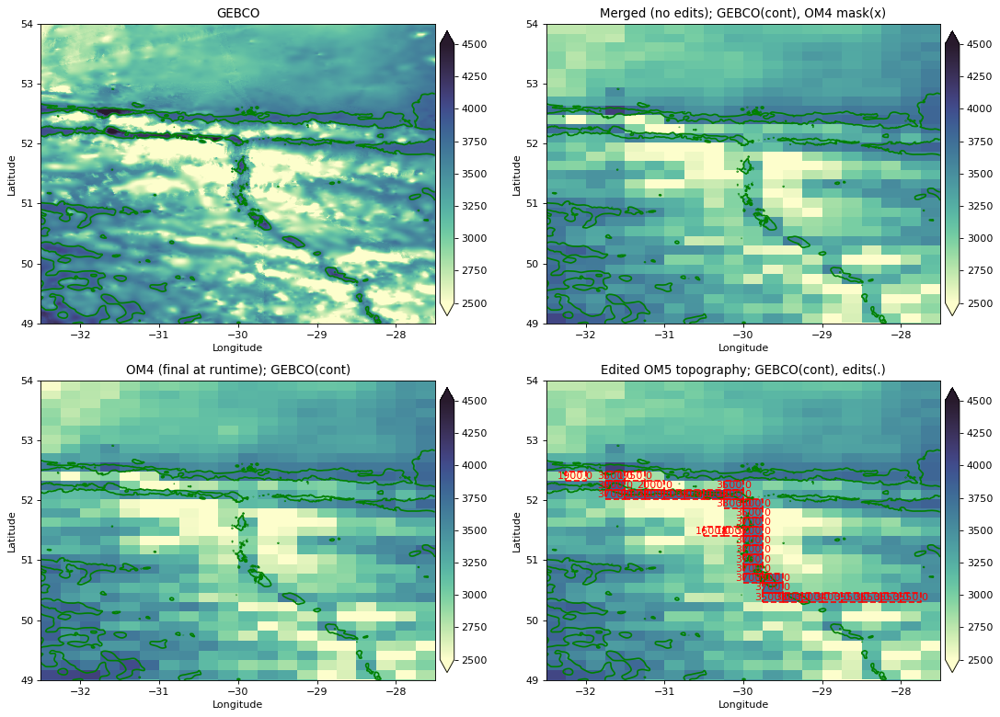

In [61]:
OM5.depth[831, 1074]=1750. # made shallower by ~ 500 m
OM5.depth[831, 1071]=1900. # made shallower by ~ 450 m
OM5.depth[830, 1075]=2000. # made shallower by ~ 400 m
OM5.depth[825, 1078]=1600. # made shallower by ~ 200 m
OM5.depth[825, 1079]=1800. # made shallower by ~ 200 m

OM5.depth[831, 1073]=3500. # made deeper 2954->3500
OM5.depth[830, 1073]=3900. # made deeper 3740->3900
OM5.depth[829, 1073]=3700. # made deeper 3261->3700
OM5.depth[829, 1074]=3800. # made deeper 3607->3800
OM5.depth[829, 1075]=3800. # made deeper 3355->3800
OM5.depth[829, 1076]=3800. # made deeper 3358->3800
OM5.depth[829, 1077]=3800. # made deeper 3364->3800
OM5.depth[829, 1078]=4000. # made deeper 3500->4000
OM5.depth[829, 1079]=3800. # made deeper 3514->3800
OM5.depth[830, 1079]=3500. # made deeper 3031->3500

OM5.depth[828, 1079]=3300. # made deeper 2951->3300
OM5.depth[828, 1080]=3600. # made deeper 3229->3600
OM5.depth[827, 1080]=3500. # made deeper 2775->3500
OM5.depth[826, 1080]=3700. # made deeper 3272->3700
OM5.depth[825, 1080]=3700. # made deeper 3086->3700
OM5.depth[824, 1080]=3700. # made deeper 3110->3700
OM5.depth[823, 1080]=3700. # made deeper 3011->3700
OM5.depth[822, 1080]=3700. # made deeper 3391->3700
OM5.depth[821, 1080]=3700. # made deeper 3493->3700
OM5.depth[820, 1080]=3700. # made deeper 3186->3700
OM5.depth[820, 1081]=3700. # made deeper 3186->3700
OM5.depth[819, 1081]=3700. # made deeper 3439->3700
OM5.depth[818, 1081]=3500. # made deeper 3082->3500
OM5.depth[818, 1082]=3800. # made deeper 3637->3800
OM5.depth[818, 1083]=3600. # made deeper 3380->3600
OM5.depth[818, 1084]=3400. # made deeper 3260->3400
OM5.depth[818, 1085]=3550. # made deeper 3354->3550
OM5.depth[818, 1086]=3550. # made deeper 3318->3550
OM5.depth[818, 1087]=3550. # made deeper 3398->3550
OM5.depth[818, 1088]=3550. # made deeper 3416->3550


region = Region(-30, 51.5, width_lon=5, width_lat=5)
map_region(region, 2500, 4500, GEBCO, OM4, OM5, '', gebco_contours=[3750], text_depths=False);

### Milne Seamount Complex

Gebco (js:je,is:ie) = 30359:31079,56999:57719
OM4 model (js:je,is:ie) = 659:676,948:962
OM5 model (js:je,is:ie) = 740:757,948:962
Using xlim = (-62.5, -59.5) ylim = (36.5, 39.5)


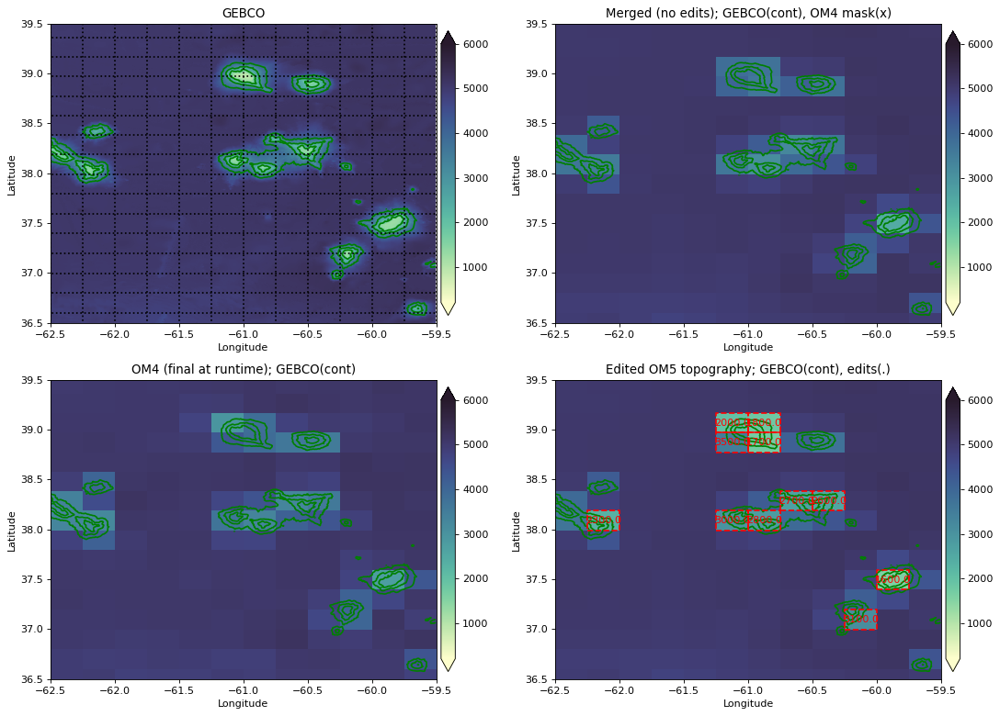

In [86]:
OM5.depth[746, 960]=1600. # from 2463
OM5.depth[754, 955]=2000. # from 3845
OM5.depth[754, 956]=1800. # from 3749
OM5.depth[753, 955]=3500. # from 4061
OM5.depth[753, 956]=1700. # from 3629

OM5.depth[751, 947]=2000. # from 2765

OM5.depth[749, 951]=2300. # from 3552

OM5.depth[753, 944]=2500. # from 2999

OM5.depth[756, 938]=2500. # from 3141

OM5.depth[750, 957]=2700. # from 3278
OM5.depth[750, 958]=2600. # from 3669
OM5.depth[749, 955]=3000. # from 3637
OM5.depth[749, 956]=2800. # from 3143

OM5.depth[744, 959]=3100. # from 4069

region = Region(-61, 38, width_lon=3, width_lat=3)
map_region(region, 200, 6000, GEBCO, OM4, OM5, '', gebco_contours=[2000,3000,4000], text_depths=False);

### Deep, narrow channel escaping southeast Labrador Basin along the western boundary

not sure where this is referencing

### Deep Fracture Zones crossing Mid-Altantic Ridge near (?, 11) and (?, 0)

### Fram Strait

I think ok

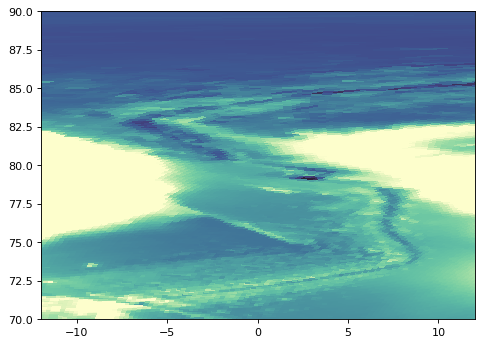

In [120]:
f, ax = plt.subplots(1,1,figsize=(7,5))
ax.pcolormesh(OM5.lonq, OM5.latq, OM5.depth, cmap=cmocean.cm.deep, vmin=1000, vmax=5500)
# ax.contour(OM5.lonq, OM5.latq, OM5.depth, levels=[1000,2000,3000], colors='k', linewidths=0.5)
ax.set_xlim([-12,12]); ax.set_ylim([70,90]);

Gebco (js:je,is:ie) = 41039:41519,71759:72239
OM4 model (js:je,is:ie) = 1003:1024,1138:1150
OM5 model (js:je,is:ie) = 1084:1105,1138:1150
Using xlim = (-1.0, 1.0) ylim = (81.0, 83.0)


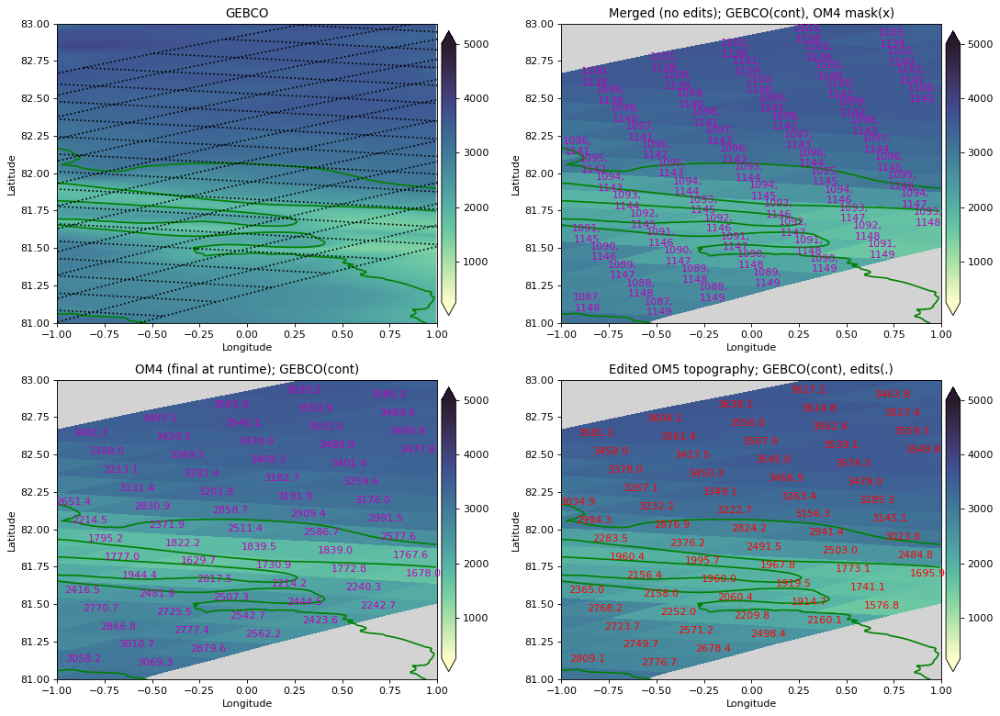

In [118]:
region = Region(0, 82, width_lon=2, width_lat=2)
map_region(region, 250, 5000, GEBCO, OM4, OM5, '', gebco_contours=[250,500,750,1000,2000,3000], text_depths=True);

### Deep gaps in the Lomonosov Ridge near the North Pole, e.g. sill near (156, 88.7)

didn't have time to alter the projection to best view polar region (don't know this area)

### Cooperation Gap within the Alpha-Mendeleev Ridge

didn't have time to alter the projection to best view polar region (don't know this area)

### Baffin Bay sills (?)

I think ok (I'm maybe not the best person to evaluate this north of 75N? ... as grid construction changes?) 

Gebco (js:je,is:ie) = 35999:36959,56159:57119
OM4 model (js:je,is:ie) = 804:840,934:952
OM5 model (js:je,is:ie) = 885:921,934:952
Using xlim = (-66.0, -62.0) ylim = (60.0, 64.0)


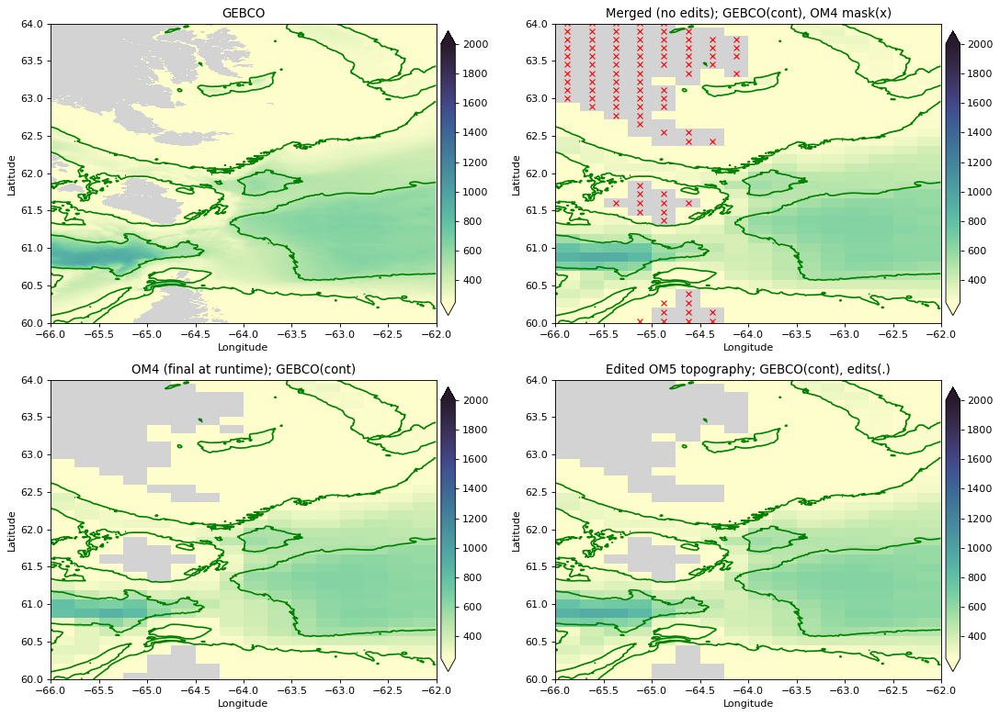

In [157]:
region = Region(-64,62, width_lon=4, width_lat=4)
map_region(region, 250, 2000, GEBCO, OM4, OM5, '', gebco_contours=[250,500], text_depths=False);

### Rockall Rise

well resolved

Gebco (js:je,is:ie) = 35519:35999,68399:68879
OM4 model (js:je,is:ie) = 788:806,1138:1148
OM5 model (js:je,is:ie) = 869:887,1138:1148
Using xlim = (-15.0, -13.0) ylim = (58.0, 60.0)


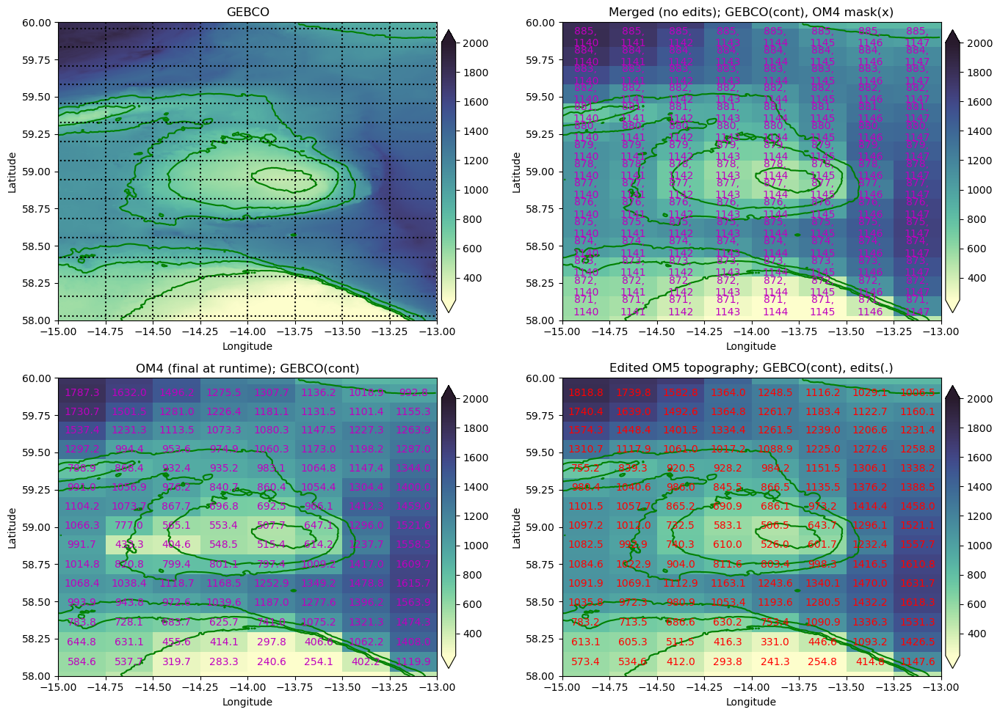

In [13]:
region = Region(-14, 59, width_lon=2, width_lat=2)
map_region(region, 250, 2000, GEBCO, OM4, OM5, '', gebco_contours=[500,750,1000], text_depths=True);